In [1]:
# If necessary, install packages
!pip install -r requirements.txt

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [2]:
# file IDs and table namesfor lobbying data files from Google Drive
lob_rpt = ("1CIq7XwaFTJmnUKdAvYyh53Et2XSJRX9d", "lob_rpt")
lob_lobbyist = ("1q1ZyLvUhsxsbPLdi_CmrNH0FqLoorr6p", "lob_lobbyist")
lob_lobbying = ("19Jef89spXbkExNpYA-s_e8GRii-0tReu", "lob_lobbying")
lob_issue = ("18-D_vW4dAHJlvFs4ARK4lgx6KdsAXWoq", "lob_issue")
lob_indus = ("1yldZYLcZTLIMQ5Xa-e-ecGgQGFWv5n4A", "lob_indus")
lob_bills = ("1qqQvNXtdhyI8KYcctpVUZ3FoIwvjWaG1", "lob_bills")
lob_agency = ("1CFi0Itpi_qg4X4wicg1FIg8S_FJfvCN0", "lob_agency")
CatCodeReference = ("1vfVA-v-lUMuykF9efl2oDN5DJK2t1PwA", "CatCodeReference")
CandidateIds = ("1k2lhAcuSQbn5z7NN3USPEbX_Rg5VV_Ky", "CandidateIds")
congress_bill_data_id = ("1-MnzV0iZ2FPYiuQgOmggjmXvxGmBzYV8", "congress_bill_data")

In [3]:
import pandas as pd
import gdown
import os

def load_csv(table, save_file=False, file_path=None, gzip=False):
    """
    Downloads a large CSV file from Google Drive into a Pandas DataFrame.
    
    Parameters:
        file_info (tuple): A tuple containing the Google Drive file ID and the table name.
        save_file (bool): If True, the file is saved. If False, it is deleted after loading.
        file_path (str, optional): The directory path where the file should be saved. Defaults to current directory.

    Returns:
        pd.DataFrame: The loaded Pandas DataFrame.
    """
    file_id, table_name = table
    
    # Set filename as the table name
    temp_file = f"{table_name}.csv"
    
    # If a file path is provided, join it with the filename
    if file_path:
        temp_file = os.path.join(file_path, temp_file)

    # Construct Google Drive download URL
    url = f"https://drive.google.com/uc?export=download&id={file_id}"

    # Download the file
    gdown.download(url, temp_file, quiet=False)

    # Load the CSV file into a Pandas DataFrame
    if gzip == False:
        df = pd.read_csv(temp_file,header=None)
    else:
        df = pd.read_csv(temp_file,header=None, compression="gzip")

    # Remove the file if save_file is False
    if not save_file:
        os.remove(temp_file)

    return df

/var/folders/bm/yntdr4q97s74g63m6p8162rw0000gn/T/ipykernel_17701/2418707545.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
/Users/christianhjorth/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [4]:
# Example usage:
df = load_csv(lob_rpt, save_file=False)  # Specify file_path if needed
print(df.head())

Downloading...
From: https://drive.google.com/uc?export=download&id=1CIq7XwaFTJmnUKdAvYyh53Et2XSJRX9d
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/lob_rpt.csv
100%|██████████| 3.29k/3.29k [00:00<00:00, 3.52MB/s]

                                  0    1
0                   MID-YEAR REPORT    m
1                MID-YEAR AMENDMENT   ma
2            MID-YEAR (NO ACTIVITY)   mn
3  MID-YEAR AMENDMENT (NO ACTIVITY)  man
4              MID-YEAR TERMINATION   mt


## Data Cleaning

In [5]:
# Creating function to visualize key aspects of each dataframe. 
def glimpse(df):
    print(f'\nShape of dataframe is: {df.shape}\n')
    print(f'Dataframe has the following columns:\n{df.columns}\n')
    print(f'Dataframe has the following data types:\n{df.dtypes}\n')
    print(f'Overview of missing values:\n{df.isnull().sum()}\n')
    print(f'Missing values as percentage of total:\n{(df.isnull().sum()/len(df))*100}\n')
    print(f'First 5 Columns:{df.head()}\n')
    print(f'Last 5 Columns:{df.tail()}\n')

### Lobbying Data

In [6]:
df_lobbying = load_csv(lob_lobbying, save_file = False)
df_lobbying.columns = ['UniqID','Registrant_Raw','Registrant','IsLobbyingFirm','Client_raw','Client','UItorg','Amount','Catcode','Source','Self','IncludeNSFS','Use','Ind','Year','Type','Typelong','Affiliate']

Downloading...
From (original): https://drive.google.com/uc?export=download&id=19Jef89spXbkExNpYA-s_e8GRii-0tReu
From (redirected): https://drive.google.com/uc?export=download&id=19Jef89spXbkExNpYA-s_e8GRii-0tReu&confirm=t&uuid=e5cd5e62-56c6-4d14-bc71-290314f80fff
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/lob_lobbying.csv
100%|██████████| 351M/351M [00:47<00:00, 7.45MB/s] 
/var/folders/bm/yntdr4q97s74g63m6p8162rw0000gn/T/ipykernel_17701/2418707545.py:33: DtypeWarning: Columns (7,11,14,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(temp_file,header=None)


In [7]:
#Dropping unecessary columns
df_lobbying = df_lobbying.drop(
['Registrant_Raw', #Same as Registrant
 'Client_raw', # Same as Client
 'Source', # Irrelevant to analysis
 'Typelong' # Same as Type
], axis=1)

# Removing all records from lobbying dataframe without an ID
df_lobbying = df_lobbying.dropna(subset=['UniqID'])

# Capitalizing all inputs in Catcode column
df_lobbying['Catcode'] = df_lobbying['Catcode'].str.upper()

# Replacing missing values in selected boolean columns with 'n' column with 'n'
boolean_columns = ['IsLobbyingFirm','Affiliate','IncludeNSFS','Ind']
df_lobbying[boolean_columns] = df_lobbying[boolean_columns].fillna(value='n')

# Changing datatype of columns
df_lobbying['Amount'] = pd.to_numeric(df_lobbying['Amount'], errors='coerce')
df_lobbying = df_lobbying.dropna(subset=['Amount'])
df_lobbying['Year'] = df_lobbying['Year'].astype('int')
df_lobbying[boolean_columns] = df_lobbying[boolean_columns].apply(lambda col: col.map({'y': True, 'n': False}).astype(bool))

# Dropping all lobbying records with Use == n, as these reports have been amendent/updated and a more recent report is avaliable.  
df_lobbying = df_lobbying[df_lobbying['Use'] != 'n']
df_lobbying = df_lobbying.drop('Use',axis=1)

# Only including records after 2011.
df_lobbying = df_lobbying[df_lobbying['Year'] >= 2011]
df_lobbying = df_lobbying.drop('Affiliate',axis=1) # Dropping the Affiliate column as all records are equal to False after Slicing. 


In [8]:
# Extract quarter dynamically (first character + "Q")
df_lobbying['Quarter'] = 'Q' + df_lobbying['Type'].str.extract(r'(\d)')[0]

# Extract report type based on suffix in 'Type' column
df_lobbying['ReportType'] = df_lobbying['Type'].apply(lambda x: 
    'Standard Report' if len(x) == 2 else
    'Amendment' if x.endswith("a") else
    'Amendment (No Activity)' if x.endswith('an') else
    'No Activity' if x.endswith('n') else
    'Termination' if x.endswith('t') else
    "Termination Amendment" if x.endswith('ta') else
    'Termination (No Activity)' if x.endswith('tn') else
    'Unknown')

df_lobbying.drop('Type',axis=1) # Dropping 'Type' column as it is uneccessary now. 

,UniqID,Registrant,IsLobbyingFirm,Client,UItorg,Amount,Catcode,Self,IncludeNSFS,Ind,Year,Quarter,ReportType
0,82c5f661-a637-45ad-a3a6-b5ba18cf8962,AstraZeneca Pharmaceuticals,False,AstraZeneca Pharmaceuticals,AstraZeneca PLC,1370000.0,H4300,x,False,True,2021,Q4,Amendment
1,84ad3a9e-5864-4227-a802-e268fbf37237,David L Horne LLC,True,Multifamily Lenders Council,Multifamily Lenders Council,15000.0,F4600,n,False,True,2021,Q4,Standard Report
2,85b111b1-5d2e-4107-bc24-0921316e29a5,Echelon Government Affairs,True,Albers Group,Albers Group,10000.0,Y4000,n,False,True,2021,Q4,Standard Report
3,87822a14-12de-478c-a34d-010fa503e539,Western Telecommunications Alliance,False,Western Telecommunications Alliance,Western Telecommunications Alliance,75000.0,C4000,p,False,True,2021,Q4,Standard Report
4,87ff989d-9d12-4fef-84ef-ab69cd616894,Financial Executives International,False,Financial Executives International,Financial Executives International,21650.0,F5000,p,False,True,2021,Q4,Standard Report
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1544068,0854dd96-ed91-4219-99d9-b84bf06ee2f8,American Express,False,American Express,American Express,440000.0,F1400,p,False,True,2022,Q4,Standard Report
1544069,086b65ba-0abe-4ed0-a3e9-a66c9ecc96a3,BL Partners Group,True,CTIA,CTIA,30000.0,C4300,i,False,False,2022,Q4,Standard Report
1544070,b01b51ba-d426-4750-ad00-0ea3c5aa2317,Vectis DC,True,"City of Montebello, CA","City of Montebello, CA",20000.0,X3000,n,False,True,2022,Q4,Standard Report
1544071,b0235c16-0a34-4e06-be62-f42a3bf52d6a,Nickles Group,True,Walmart Inc,Walmart Inc,80000.0,G4300,i,False,False,2022,Q4,Standard Report


### Industry

In [9]:
df_industry = load_csv(lob_indus, save_file = False)
df_industry.columns = ['Client','Sub','Total','Year','Catcode']

Downloading...
From: https://drive.google.com/uc?export=download&id=1yldZYLcZTLIMQ5Xa-e-ecGgQGFWv5n4A
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/lob_indus.csv
100%|██████████| 20.3M/20.3M [00:10<00:00, 1.87MB/s]


In [10]:
# Only including records after 2011.
df_industry = df_industry[df_industry['Year'] >= 2011]

# Capitalizing all inputs in Catcode column
df_industry['Catcode'] = df_industry['Catcode'].str.upper()

#### Catcode References

In [11]:
# Try reading the file with extra handling for irregularities
df_catcode_references = load_csv(CatCodeReference, save_file = False)
df_catcode_references.columns = ['Catcode','Catname','Catorder','Industry','Sector','SectorLong']

Downloading...
From: https://drive.google.com/uc?export=download&id=1vfVA-v-lUMuykF9efl2oDN5DJK2t1PwA
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/CatCodeReference.csv
100%|██████████| 43.0k/43.0k [00:00<00:00, 444kB/s]


In [12]:
# merging catcode reference with industry column
df_industry = pd.merge(df_industry, df_catcode_references[['Catcode','Catname', 'Industry', 'Sector']],
                     left_on='Catcode', right_on='Catcode', how='left')

### Agency

In [13]:
df_agency = load_csv(lob_agency, save_file=False)
df_agency.columns = ['UniqID','AgencyID','Agency']

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1CFi0Itpi_qg4X4wicg1FIg8S_FJfvCN0
From (redirected): https://drive.google.com/uc?export=download&id=1CFi0Itpi_qg4X4wicg1FIg8S_FJfvCN0&confirm=t&uuid=78f867ab-5d57-45f4-91ee-50c6f24998e2
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/lob_agency.csv
100%|██████████| 256M/256M [00:57<00:00, 4.42MB/s] 


### Issues

In [14]:
df_issue = load_csv(lob_issue, save_file=False)
df_issue.columns = ['SI_ID','UniqID','IssueID','Issue','SpecificIssue','Year']

Downloading...
From (original): https://drive.google.com/uc?export=download&id=18-D_vW4dAHJlvFs4ARK4lgx6KdsAXWoq
From (redirected): https://drive.google.com/uc?export=download&id=18-D_vW4dAHJlvFs4ARK4lgx6KdsAXWoq&confirm=t&uuid=e709f5fb-8480-4931-98e3-a840033ef6e0
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/lob_issue.csv
100%|██████████| 787M/787M [03:49<00:00, 3.43MB/s] 


In [15]:
# Only including records after 2011.
df_issue = df_issue[df_issue['Year'] >= 2011]

# Retrieving records with missing values for SpecificIssue 
specific_issue_missing = df_issue[df_issue['SpecificIssue'].isna()]

# Imputing missing values in SpecificIssue column with value from Issue column. 
df_issue['SpecificIssue'] = df_issue['SpecificIssue'].fillna(df_issue['Issue'])

# Dropping IssueID column as this has no value for our analysis. 
df_issue.drop('IssueID',axis=1)

,SI_ID,UniqID,Issue,SpecificIssue,Year
0,3001624,02e92bd6-0159-495e-9d00-8a490a0be8be,Disaster & Emergency Planning,Issues affecting manufacturer of railroad and ...,2022
1,3001625,02e92bd6-0159-495e-9d00-8a490a0be8be,Environment & Superfund,Issues affecting manufacturer of railroad and ...,2022
2,3001626,02e92bd6-0159-495e-9d00-8a490a0be8be,"Labor, Antitrust & Workplace",Issues affecting manufacturer of railroad and ...,2022
3,3001627,02e92bd6-0159-495e-9d00-8a490a0be8be,Roads & Highways,Issues affecting manufacturer of railroad and ...,2022
4,3001628,02e92bd6-0159-495e-9d00-8a490a0be8be,Railroads,Issues affecting manufacturer of railroad and ...,2022
...,...,...,...,...,...
3009859,3076640,0a62db56-bdc4-4f4c-9329-5b420066f53c,Small Business,Women's Business Center program reauthorizatio...,2022
3009860,3076641,0a6de630-f472-4dc2-a796-b58d67831573,Defense,Issues related to tungsten manufacturing,2022
3009861,3076642,0a7f2d03-7d7a-450c-b20a-a48c0fa93e92,Automotive Industry,Issues related to autonomous vehicles Cybersec...,2022
3009862,3076643,0a7f2d03-7d7a-450c-b20a-a48c0fa93e92,Banking,Financial services issues Industrial loan bank...,2022


#### Bills

In [16]:
df_bills = load_csv(lob_bills, save_file=False)
df_bills.columns = ['B_ID', 'SI_ID', 'CongNo', 'Bill_Name']

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1qqQvNXtdhyI8KYcctpVUZ3FoIwvjWaG1
From (redirected): https://drive.google.com/uc?export=download&id=1qqQvNXtdhyI8KYcctpVUZ3FoIwvjWaG1&confirm=t&uuid=a7f0a7bc-0a10-411c-adec-d81f5515ba83
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/lob_bills.csv
100%|██████████| 219M/219M [00:27<00:00, 8.01MB/s] 


In [17]:
# Importing Year column from the issues dataframe 
# this is to impute missing values for congress number by cross-referencing Year with a dictionary containing Year and Congress No. at the time. 
df_bills = df_bills.merge(df_issue[['SI_ID', 'Year']], on='SI_ID', how='left')

# Dictionary mapping Congress by year. Retrieved from: https://www.congress.gov/help/field-values/congresses
congress_number_by_year = {
2025: 119.0, 2026: 119.0,2023: 118.0,2024: 118.0,2021: 117.0,2022: 117.0,2019: 116.0,2020: 116.0,
2017: 115.0,2018: 115.0,2015: 114.0,2016: 114.0,2013: 113.0,2014: 113.0,2011: 112.0,
2012: 112.0,2009: 111.0,2010: 111.0,2007: 110.0,2008: 110.0,2005: 109.0,2006: 109.0,
2003: 108.0,2004: 108.0,2001: 107.0,2002: 107.0,1999: 106.0,2000: 106.0,1998: 105.0
}

# Impute missing values
df_bills['CongNo'] = df_bills['CongNo'].fillna(df_bills['Year'].map(congress_number_by_year))

# Dropping 'Year' column again
df_bills = df_bills.drop('Year',axis=1)

# Converting datatype of CongNo column
df_bills['CongNo'] = df_bills['CongNo'].astype('Int64')

In [ ]:
# Dropping records with missing value in CongNo, as these records are not connected to Lobby Issues dataframe through Foreign Key - and are hence excessive
df_bills = df_bills.dropna(subset=['CongNo'])

In [19]:
df_bills["Bill_Name"] = df_bills["Bill_Name"].str.replace(r"^H\.?(\d+)$", r"H.R.\1", regex=True)

### Lobbyist

In [20]:
df_lobbyist = load_csv(lob_lobbyist,save_file=False)
df_lobbyist.columns = ['UniqID','Lobbyist_raw','Lobbyist','LobbyistID','Year','OfficialPosition','CID','Formercongmem']

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1q1ZyLvUhsxsbPLdi_CmrNH0FqLoorr6p
From (redirected): https://drive.google.com/uc?export=download&id=1q1ZyLvUhsxsbPLdi_CmrNH0FqLoorr6p&confirm=t&uuid=7fe0614e-bbac-4322-96b6-3bcf04ec3a87
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/lob_lobbyist.csv
100%|██████████| 410M/410M [00:56<00:00, 7.20MB/s] 


In [21]:
# Only including records after 2011.
df_lobbyist = df_lobbyist[df_lobbyist['Year'] >= 2011]

# Dropping missing values
df_lobbyist = df_lobbyist.dropna(subset=['LobbyistID'])
df_lobbyist = df_lobbyist.dropna(subset=['Year']) # Dropping this record as well as it does not have any UniqId

# Dropping uneccessary column
df_lobbyist = df_lobbyist.drop('Lobbyist_raw',axis=1)

# Chaging data type of Year column
df_lobbyist['Year'] = df_lobbyist['Year'].astype('Int64')

# Imputing missing values in 'Formercongmem' column -- if CID = Blank --> 'n', if CID != Blank --> 'y'
df_lobbyist.loc[df_lobbyist['Formercongmem'].isna(), 'Formercongmem'] = df_lobbyist['CID'].apply(
    lambda x: 'n' if pd.isna(x) else 'y')

# Changing data type of Formercongmem column to Boolean
df_lobbyist['Formercongmem'] = df_lobbyist['Formercongmem'].map({'y': True, 'n': False}).astype(bool)

# Imputing missing values for CID column
df_lobbyist['CID'] = df_lobbyist['CID'].fillna(value='Not Congress Member')


In [22]:
# Pringint unique values in official position column
print(len(df_lobbyist['OfficialPosition'].unique()))

# Considering the amount of missing values and unique values - OfficialPosition column is dropped due to providing small value to further analysis
df_lobbyist = df_lobbyist.drop('OfficialPosition',axis=1)

41623


#### Candidate IDs

In [23]:
df_candidate = load_csv(CandidateIds,save_file=False)
df_candidate.columns = ['CID', 'CRPName', 'Party', 'DistIDRunFor', 'FECCandID']

Downloading...
From: https://drive.google.com/uc?export=download&id=1k2lhAcuSQbn5z7NN3USPEbX_Rg5VV_Ky
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/CandidateIds.csv
100%|██████████| 970k/970k [00:00<00:00, 3.10MB/s]


In [24]:
# Merge on the common 'CID' column to include the columns from df_candidate
df_lobbyist = pd.merge(
    df_lobbyist,
    df_candidate[['CID', 'CRPName', 'Party', 'DistIDRunFor', 'FECCandID']],
    on='CID',
    how='left'
)

## Narrowing Scope

In [25]:
# Only including lobbying reports related to specific issues
chosen_issues = ['Health Issues', 'Medical Research & Clin Labs', 'Pharmacy', 'Medicare & Medicaid', 'Science & Technology', 'Taxes']
df_issue = df_issue[df_issue['Issue'].isin(chosen_issues)]

In [26]:
# Dropping lobbying reports that are no longer referenced in df_issue table
df_lobbying = df_lobbying[df_lobbying['UniqID'].isin(df_issue['UniqID'])]

# dropping lobbyist records for lobbyists that are no longer involved in the lobbying reports from cleaned df_lobbying df.
df_lobbyist = df_lobbyist[df_lobbyist['UniqID'].isin(df_lobbying['UniqID'])]

# droppping bills records that are not related to any of the chosen issues. 
df_bills = df_bills[df_bills['SI_ID'].isin(df_issue['SI_ID'])]

# droppping agency records that are not related to any of the current reports. 
df_agency = df_agency[df_agency['UniqID'].isin(df_lobbying['UniqID'])]

# droppping industry records that are not related to any of the current reports.
df_industry = df_industry[df_industry['Catcode'].isin(df_lobbying['Catcode'])]


#### Importing additional information about bills

In [27]:
df_congress_bill_data = load_csv(congress_bill_data_id, save_file=False)
df_congress_bill_data.columns = ['bill_number','congress_number','bill_title','policy_area','introduced_date',
                                 'bill_type','full_bill_code','sponsor_name','sponsor_party','sponsor_bioguide_id']
df_congress_bill_data = df_congress_bill_data.iloc[1:] # dropping first row of dataframe

Downloading...
From: https://drive.google.com/uc?export=download&id=1-MnzV0iZ2FPYiuQgOmggjmXvxGmBzYV8
To: /Users/christianhjorth/Documents/GitHub/master_thesis25/congress_bill_data.csv
100%|██████████| 4.26M/4.26M [00:00<00:00, 4.65MB/s]


In [28]:
df_congress_bill_data['congress_number'] = df_congress_bill_data['congress_number'].astype('Int64')

df_congress_bill_data = df_congress_bill_data.merge(
    df_bills[['B_ID', 'CongNo', 'Bill_Name']],
    left_on=['full_bill_code', 'congress_number'],
    right_on=['Bill_Name', 'CongNo'],
    how='left'
).drop(columns=['Bill_Name', 'CongNo'],axis = 1)  # Drop duplicate columns after merge if needed

In [29]:
df_congress_bill_data[df_congress_bill_data['sponsor_party'].isna()].to_csv('missing_sponsor_data.csv')

In [30]:
# Dropping bill records we don't have any data sponsor data on. 
df_bills = df_bills[df_bills['B_ID'].isin(df_congress_bill_data['B_ID'])]

## Restructuring Data for Efficiency

#### Main Table

In [31]:
# Merge all tables on 'UniqID' to capture all required fields
df_master_table = (
    df_lobbying
    .merge(df_agency, on='UniqID', how='left')
    .merge(df_lobbyist, on='UniqID', how='left')
    .merge(df_issue, on='UniqID', how='left')
)

# Select only the required unique columns
df_master_table = df_master_table[['UniqID', 'AgencyID', 'LobbyistID', 'SI_ID']].drop_duplicates()

# Add a unique MasterID
df_master_table.insert(0, 'MasterID', range(1001, 1001 + len(df_master_table)))

df_master_table['AgencyID'] = df_master_table['AgencyID'].astype('Int64') # changing data type of AgencyID column

In [32]:
# we observe that some lobbying instances are not related to a Lobbyist or Agency. 
df_master_table.isnull().sum()

MasterID          0
UniqID            0
AgencyID      10211
LobbyistID      976
SI_ID             0
dtype: int64

#### Industry Table

In [33]:
#Summarize lobbying data to only include Ind=True records
df_filtered_industry_summary = (
    df_lobbying[df_lobbying["Ind"] == True]
    .groupby(["Catcode", "Year"])
    .agg(
        Total_Lobbying_Reported=("Amount", "sum"),  # Sum lobbying spending that counts towards industry totals
    ).reset_index())

# Summarize industry data by Catcode + Year (CPK in this table)
df_industry_sum = (
    df_industry.groupby(["Catcode", "Year"])
    .agg(
        Total_Lobbying_Spending=("Total", "sum"),  # Sum total spending per industry per year
        Unique_Clients=("Client", "nunique")  # Count unique clients per industry per year
    ).reset_index()
)

# Merge with industry summary (which contains total lobbying spending and unique clients)
df_industry_summary = df_filtered_industry_summary.merge(
    df_industry_sum,
    on=["Catcode", "Year"],
    how="left")

# Extract unique Catname, Industry, and Sector information per Catcode
df_industry_unique = df_industry[["Catcode", "Catname", "Industry", "Sector"]].drop_duplicates()

# Merge additional industry metadata
df_industry_summary = df_industry_summary.merge(
    df_industry_unique,
    on="Catcode",
    how="left"
)

## Agency Table

In [34]:
# Dropping duplicate entries of AgencyID and Agency combination
df_agency_final = df_agency[['AgencyID', 'Agency']].drop_duplicates()

# Displaying potential duplicates in AgencyID column
df_agency_final[df_agency_final.duplicated(subset=['AgencyID'], keep=False)].sort_values('AgencyID')

# due to some inconsistencies in the typing of Agency Name, we have a few duplicated Agency ID's. 
to_drop = [
    'Federal Deposit Insurance Commission',
    'Postal Rate Commission',
    'Defense Security Assistance Agency',
    'ACCESS Board',
    'Office of National Aids Policy'
]
df_agency_final = df_agency_final[~df_agency_final['Agency'].isin(to_drop)]

#### Lobbyist Table

In [35]:
df_lobbyist_final = df_lobbyist[['LobbyistID', 'Lobbyist', 'Formercongmem', 'Party']].drop_duplicates()

In [36]:
# Imputing missing values for political party for former congress-men
missing_political_party = {
    'Y0000022381L' : 'R','Y0000014172L' : 'R','Y0000041393L' : 'R','Y0000041198L' : 'D','Y0000031994L' : 'R','Y0000040464L' : 'R',
    'Y0000041214L' : 'D','Y0000040343L' : 'R','Y0000026610L' : 'R','Y0000042045L' : 'R','Y0000041638L' : 'R','Y0000027785L' : 'R',
    'Y0000041137L' : 'D','Y0000009728L' : 'R','Y0000041060L' : 'R','Y0000027979L' : 'R','Y0000040107L' : 'D','Y0000030165L' : 'D',
    'Y0000008316L' : 'R','Y0000041693L' : 'D','Y0000041437L' : 'D','Y0000000158L' : 'R','Y0000040464M' : 'R','Y0000040575L' : 'R',
    'Y0000042027L' : 'D','Y0000009666L' : 'D','Y0000038683L' : 'R','Y0000046534L' : 'R','Y0000041860L' : 'D','Y0000028461L' : 'R',
    'Y0000014475L' : 'D','Y0000017606L' : 'D','Y0000011321L' : 'R','Y0000042041L' : 'R','Y0000041375L' : 'D','Y0000041586L' : 'D',
    'Y0000041364L' : 'D','Y0000017415L' : 'R','Y0000008436L' : 'R','Y0000045198L' : 'R','Y0000006265L' : 'R','Y0000035408L' : 'R',
    'Y0000040391L' : 'R','Y0000041827L' : 'R','Y0000041317L' : 'R','Y0000042035L' : 'D','Y0000040953L' : 'D','Y0000012587L' : 'D',
    'Y0000000545L' : 'D','Y0000005168L' : 'D','Y0000005429L' : 'R','Y0000028048L' : 'R','Y0000039653L' : 'D','Y0000015675L' : 'D',
    'Y0000014080L' : 'D','Y0000041094L' : 'D','Y0000025402L' : 'D','Y0000033912L' : 'R','Y0000027950L' : 'R','Y0000003201L' : 'D',
    'Y0000046532L' : 'D','Y0000027397L' : 'D','Y0000040428L' : 'R','Y0000017752L' : 'D','Y0000000969L' : 'D','Y0000016284L' : 'R',
    'Y0000001540L' : 'D','Y0000008788L' : 'D','Y0000055101L' : 'D','Y0000019350L' : 'R','Y0000028862L' : 'D','Y0000047746L' : 'D',
    'Y0000020586L' : 'D','Y0000007555L' : 'R'
    }

df_lobbyist_final['Party'] = df_lobbyist_final['Party'].fillna(df_lobbyist_final['LobbyistID'].map(missing_political_party))

#### Issue Table

In [37]:
# Only keeping necessary columns for new table
df_issue_final = df_issue[['SI_ID','Issue','SpecificIssue','Year']]

df_issue_final = df_issue_final.merge(
    df_bills[['SI_ID','B_ID']],
    on = 'SI_ID',
    how = 'left'
)

In [38]:
# about 15% of issue records are not related to a bill.  
df_issue_final.isnull().sum()

SI_ID                 0
Issue                 0
SpecificIssue         0
Year                  0
B_ID             272804
dtype: int64

#### Bills Table

In [39]:
df_bills_final = df_bills[['B_ID','CongNo','Bill_Name']] # only keeping necessary columns
df_bills_final = df_bills_final[['B_ID', 'CongNo', 'Bill_Name']].drop_duplicates() # Dropping duplicates from dataframe. 

In [40]:
# checking if all B_ID's from parent table exists in child table. 
missing_b_ids_in_bills = df_issue_final[~df_issue_final["B_ID"].isin(df_bills_final["B_ID"])]
print(missing_b_ids_in_bills['B_ID'].unique()) # all missing ID's from parent table are missing values. 

# checking if all B_ID's in child table table exists in parent table. 
all_b_ids_exist_in_issue = df_bills_final["B_ID"].isin(df_issue_final["B_ID"]).all()
print(all_b_ids_exist_in_issue)



[nan]
True


#### Sponsor Table

In [41]:
df_sponsor = df_congress_bill_data[['sponsor_bioguide_id','B_ID','sponsor_name','sponsor_party']]

df_sponsor.rename(columns={'sponsor_bioguide_id':'SponsorID','sponsor_name':'SponsorName','sponsor_party':'SponsorParty'},inplace=True)

/var/folders/bm/yntdr4q97s74g63m6p8162rw0000gn/T/ipykernel_17701/658583622.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sponsor.rename(columns={'sponsor_bioguide_id':'SponsorID','sponsor_name':'SponsorName','sponsor_party':'SponsorParty'},inplace=True)


In [42]:
# checking if all B_ID's from parent table exists in child table. 
missing_b_ids_in_sponsor = df_bills_final[~df_bills_final["B_ID"].isin(df_sponsor["B_ID"])]
print(missing_b_ids_in_sponsor['B_ID'].unique()) # all missing ID's from parent table are missing values. 

# checking if all B_ID's in child table table exists in parent table. 
all_b_ids_exist_in_bills = df_sponsor["B_ID"].isin(df_bills_final["B_ID"]).all()
print(all_b_ids_exist_in_bills)


[]
True


In [43]:
df_sponsor.isnull().sum() # we observe that 95 bills are missing. these are either Reserved for Speaker, or dosen't actually have a Sponsor.

SponsorID       95
B_ID             0
SponsorName     95
SponsorParty    95
dtype: int64

In [44]:
df_sponsor = df_sponsor[['SponsorID','B_ID','SponsorName','SponsorParty']].drop_duplicates() # dropping duplicate records

In [45]:
# check if one bill can be related to multiple sponsors
duplicated_bills = df_sponsor[df_sponsor.duplicated(subset=['B_ID'], keep=False)]
duplicated_bills

,SponsorID,B_ID,SponsorName,SponsorParty


In [46]:
df_bills_final

,B_ID,CongNo,Bill_Name
9,hr1324-117,117,H.R.1324
10,s467-117,117,S.467
11,hr1667-117,117,H.R.1667
12,s610-117,117,S.610
13,hr851-117,117,H.R.851
...,...,...,...
7255965,s4614-117,117,S.4614
7258799,s3961-117,117,S.3961
7258800,hr5598-117,117,H.R.5598
7259179,hr6400-117,117,H.R.6400


In [47]:
# considering we have a one-to-many relationship between sponsor and bills, we can simply merge the two tables by including sponsor information in the Bills Table. 
df_bills_final = df_bills_final.merge(df_sponsor[['B_ID','SponsorName','SponsorParty']], on = 'B_ID', how = 'left')

## Network Analysis

In [48]:
df_edges = df_master_table[['UniqID','SI_ID']].drop_duplicates()

# Merge df_edges with df_lobbying to get UItorg and Amount
df_edges = df_edges.merge(df_lobbying[['UniqID', 'UItorg', 'Amount', 'Year']], on='UniqID', how='left')

# Merge the result with df_bills to get B_ID
df_edges = df_edges.merge(df_issue_final[['SI_ID', 'B_ID']], on='SI_ID', how='left')

df_edges_final = df_edges.drop('SI_ID',axis=1)
df_edges_final

,UniqID,UItorg,Amount,Year,B_ID
0,82c5f661-a637-45ad-a3a6-b5ba18cf8962,AstraZeneca PLC,1370000.0,2021,hr19-117
1,82c5f661-a637-45ad-a3a6-b5ba18cf8962,AstraZeneca PLC,1370000.0,2021,s2164-117
2,82c5f661-a637-45ad-a3a6-b5ba18cf8962,AstraZeneca PLC,1370000.0,2021,hr3749-117
3,82c5f661-a637-45ad-a3a6-b5ba18cf8962,AstraZeneca PLC,1370000.0,2021,hr5376-117
4,82c5f661-a637-45ad-a3a6-b5ba18cf8962,AstraZeneca PLC,1370000.0,2021,s2911-117
...,...,...,...,...,...
1721459,0854dd96-ed91-4219-99d9-b84bf06ee2f8,American Express,440000.0,2022,hr8152-117
1721460,0854dd96-ed91-4219-99d9-b84bf06ee2f8,American Express,440000.0,2022,s4528-117
1721461,0854dd96-ed91-4219-99d9-b84bf06ee2f8,American Express,440000.0,2022,hr5376-117
1721462,b0235c16-0a34-4e06-be62-f42a3bf52d6a,Walmart Inc,80000.0,2022,hr5376-117


In [49]:
df_bills_final = df_bills_final.dropna(subset=['SponsorName'])
df_bills_final

,B_ID,CongNo,Bill_Name,SponsorName,SponsorParty
0,hr1324-117,117,H.R.1324,"Rep. Bilirakis, Gus M. [R-FL-12]",R
1,s467-117,117,S.467,"Sen. Murkowski, Lisa [R-AK]",R
2,hr1667-117,117,H.R.1667,"Rep. Wild, Susan [D-PA-7]",D
3,s610-117,117,S.610,"Sen. Kaine, Tim [D-VA]",D
4,hr851-117,117,H.R.851,"Rep. Underwood, Lauren [D-IL-14]",D
...,...,...,...,...,...
23477,hr8494-117,117,H.R.8494,"Rep. Clark, Katherine M. [D-MA-5]",D
23478,s4614-117,117,S.4614,"Sen. Smith, Tina [D-MN]",D
23479,s3961-117,117,S.3961,"Sen. Daines, Steve [R-MT]",R
23480,hr5598-117,117,H.R.5598,"Rep. Sherman, Brad [D-CA-30]",D


In [50]:
import networkx as nx
import matplotlib.pyplot as plt

In [187]:
import networkx as nx

# Create a directed graph
G = nx.DiGraph()


In [160]:
# Add nodes for Lobbying Organizations (UItorg) from df_edges_final
for lobbyist in df_edges_final["UItorg"].unique():
    G.add_node(lobbyist, type="lobbyist")

In [161]:
# Add nodes for Bills (B_ID) from df_bills_final
for bill in df_bills_final["B_ID"].unique():
    G.add_node(bill, type="bill")

In [162]:
# Add nodes for Politicians (SponsorName) from df_bills_final
for sponsor in df_bills_final["SponsorName"].unique():
    G.add_node(sponsor, type="politician")


In [163]:
# Add edges: Lobbyist → Bill (from df_edges_final)
for _, row in df_edges_final.iterrows():
    G.add_edge(row["UItorg"], row["B_ID"], type="lobbyist-bill", weight=row["Amount"])


In [164]:
# Add edges: Bill → Politician (from df_bills_final)
for _, row in df_bills_final.iterrows():
    G.add_edge(row["B_ID"], row["SponsorName"], type="bill-sponsor")

In [ ]:
# Save graph to a file (GraphML format for Gephi visualization)
# nx.write_graphml(G, "lobbying_network.graphml")

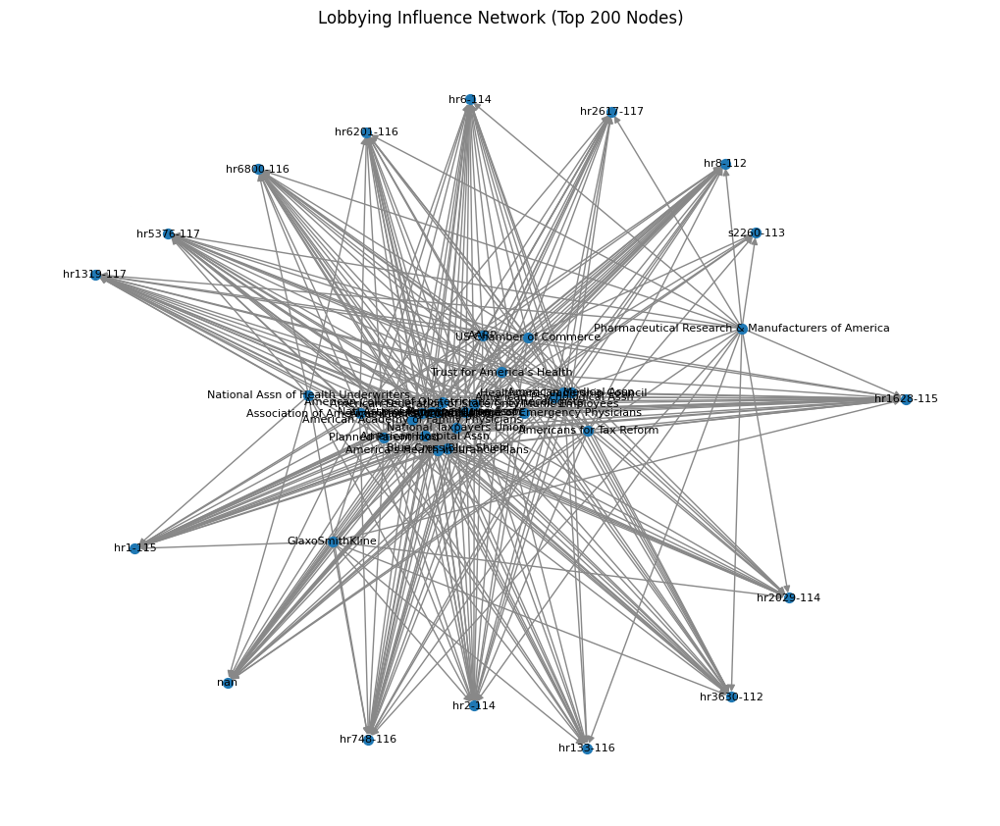

In [166]:
import matplotlib.pyplot as plt
import networkx as nx

# Generate a subgraph with the top 200 nodes by degree centrality
top_nodes = [node for node, _ in sorted(nx.degree_centrality(G).items(), key=lambda x: x[1], reverse=True)[:40]]
subG = G.subgraph(top_nodes)

# Get node positions
pos = nx.spring_layout(subG)

# Draw the network
plt.figure(figsize=(10, 8))
nx.draw(subG, pos, with_labels=True, node_size=50, font_size=8, edge_color="#888")
plt.title("Lobbying Influence Network (Top 200 Nodes)")
plt.show()

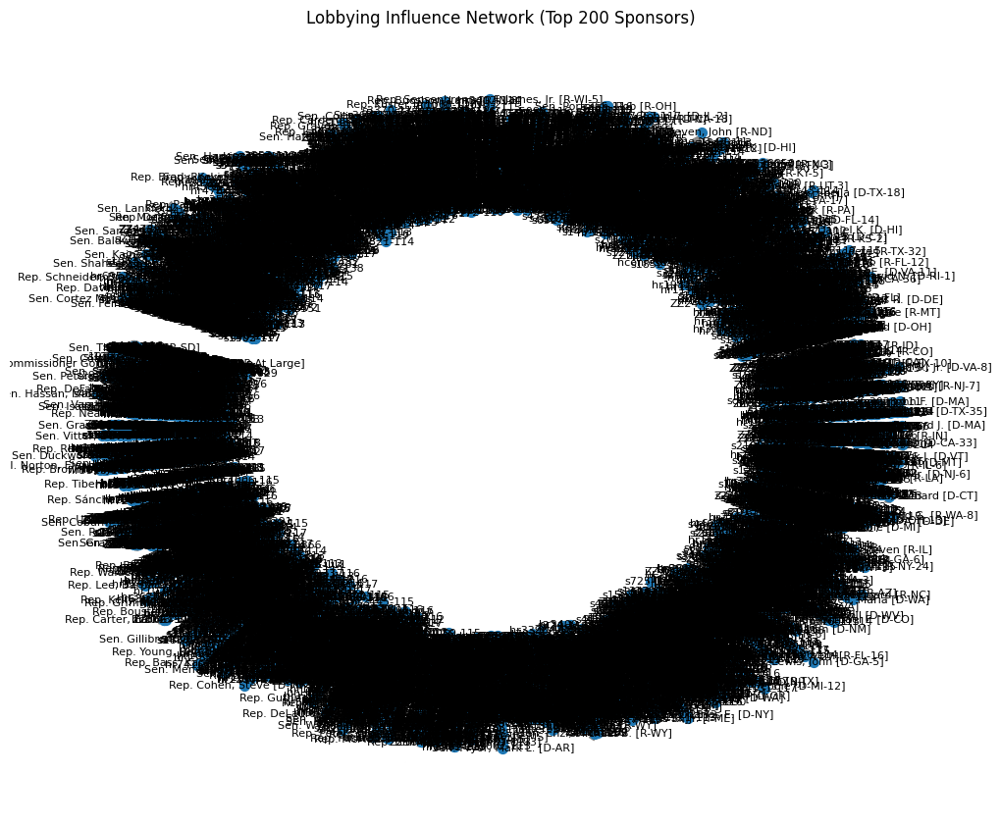

In [138]:
import matplotlib.pyplot as plt
import networkx as nx

# Use the same filtered subgraph
top_nodes = set(filtered_bills["SponsorName"].unique()).union(set(filtered_b_ids))
subG = G.subgraph(top_nodes)

# Get node positions
pos = nx.spring_layout(subG)

# Draw network
plt.figure(figsize=(10, 8))
nx.draw(subG, pos, with_labels=True, node_size=50, font_size=8, edge_color="#888")
plt.title("Lobbying Influence Network (Top 200 Sponsors)")
plt.show()

In [175]:
# Count occurrences of each SponsorName
sponsor_counts = df_bills_final['SponsorName'].value_counts()

# Get the top 10 SponsorName counts
top_10_sponsor_counts = sponsor_counts.head(20)

# Display the top 10 counts
print(top_10_sponsor_counts)

SponsorName
Sen. Casey, Robert P., Jr. [D-PA]    232
Sen. Sanders, Bernard [I-VT]         215
Sen. Durbin, Richard J. [D-IL]       201
Sen. Klobuchar, Amy [D-MN]           194
Sen. Brown, Sherrod [D-OH]           190
Sen. Wyden, Ron [D-OR]               181
Sen. Collins, Susan M. [R-ME]        180
Sen. Menendez, Robert [D-NJ]         169
Sen. Blunt, Roy [R-MO]               162
Sen. Thune, John [R-SD]              157
Rep. Boehner, John A. [R-OH-8]       155
Sen. Stabenow, Debbie [D-MI]         153
Rep. Blumenauer, Earl [D-OR-3]       149
Sen. Rubio, Marco [R-FL]             146
Sen. Feinstein, Dianne [D-CA]        144
Sen. Hatch, Orrin G. [R-UT]          144
Sen. Graham, Lindsey [R-SC]          141
Sen. McConnell, Mitch [R-KY]         139
Sen. Portman, Rob [R-OH]             132
Sen. Murray, Patty [D-WA]            130
Name: count, dtype: int64


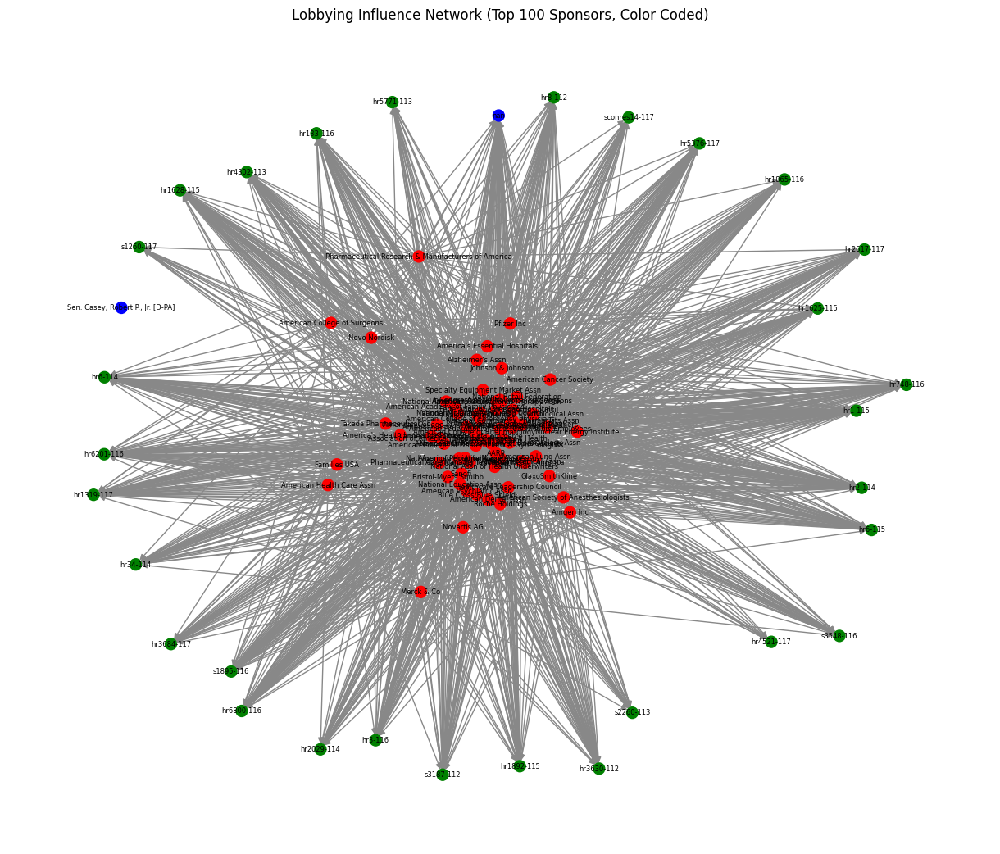

In [167]:
# Compute degree centrality and filter top 50 sponsors
degree_centrality = nx.degree_centrality(G)
top_sponsors = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:100]

# Filter subgraph with top 50 sponsors and their connected nodes
subG = G.subgraph(top_sponsors)

# Use Kamada-Kawai layout for better node spacing
# pos = nx.kamada_kawai_layout(subG)
# pos = nx.spectral_layout(subG)
pos = nx.spring_layout(subG)


# Define colors for different node types
color_map = []
for node in subG:
    if node in df_bills_final["B_ID"].values:
        color_map.append("green")  # Bills
    elif node in df_edges_final["UItorg"].values:
        color_map.append("red")  # Lobbyists
    else:
        color_map.append("blue")  # Sponsors

# Plot the refined network
plt.figure(figsize=(12, 10))
nx.draw(subG, pos, with_labels=True, node_color=color_map, node_size=100, font_size=6, edge_color="#888")
plt.title("Lobbying Influence Network (Top 100 Sponsors, Color Coded)")
plt.show()

In [143]:
nx.write_graphml(subG, "/Users/christianhjorth/Downloads/lobbying_network_filtered.graphml")


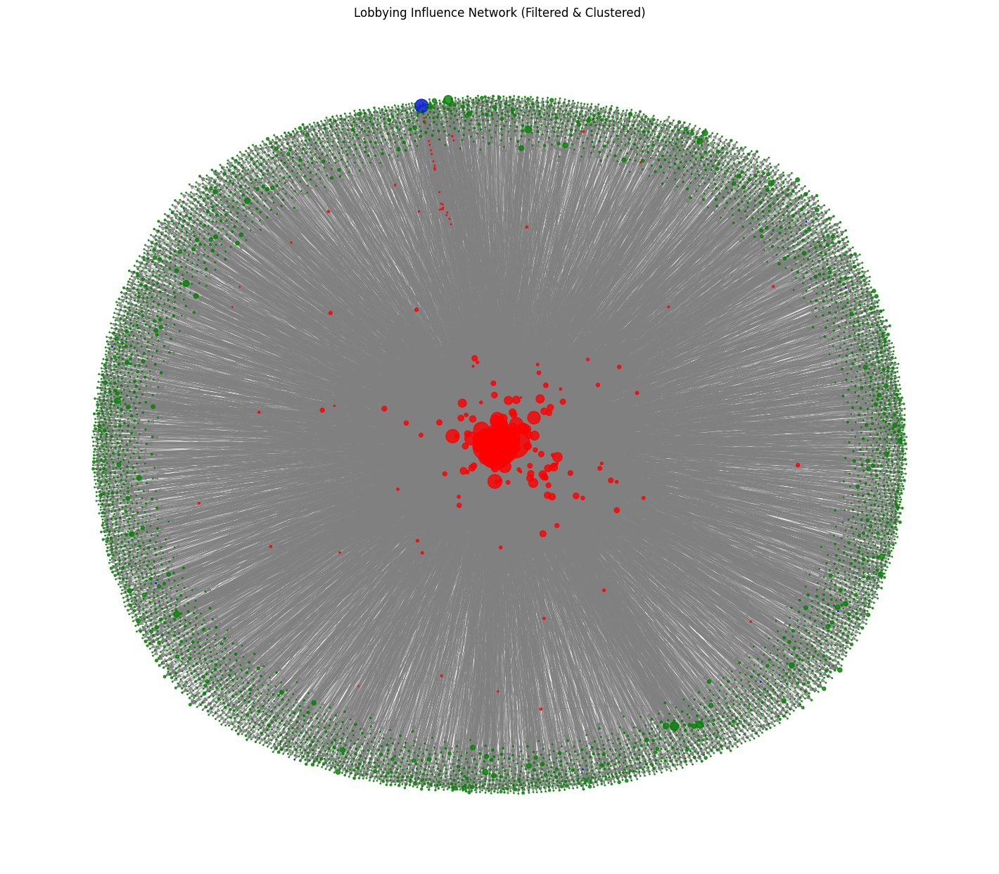

In [ ]:
# Reconstruct Graph G
G = nx.DiGraph()
for _, row in df_edges_final.iterrows():
    G.add_edge(row["UItorg"], row["B_ID"], weight=row["Amount"])
for _, row in df_bills_final.iterrows():
    G.add_edge(row["B_ID"], row["SponsorName"])

#  Filter Edges - Keep Only Strongest Lobbying Connections
threshold = df_edges_final["Amount"].quantile(0.95)  # Keep top 5% highest lobbying amounts
filtered_edges = df_edges_final[df_edges_final["Amount"] >= threshold]

# Create a subgraph with only the strongest connections
strong_edges = [(row["UItorg"], row["B_ID"]) for _, row in filtered_edges.iterrows()]
subG = G.edge_subgraph(strong_edges).copy()

#  Community Detection - Identify Lobbying Clusters
communities = nx.community.louvain_communities(subG)  # Louvain method for finding clusters
community_map = {node: i for i, comm in enumerate(communities) for node in comm}

#  Compute Centrality and Adjust Node Sizes
degree_centrality = nx.degree_centrality(subG)
node_sizes = [7000 * degree_centrality.get(node, 0) for node in subG.nodes()]  # Larger key players

#  Assign Node Colors Based on Type & Communities
color_map = []
for node in subG:
    if node in df_bills_final["B_ID"].values:
        color_map.append("green")  # Bills
    elif node in df_edges_final["UItorg"].values:
        color_map.append("red")  # Lobbyists
    else:
        color_map.append("blue")  # Sponsors (Politicians)

#  Use Fruchterman-Reingold Layout for Better Separation
pos = nx.fruchterman_reingold_layout(subG, seed=42)

#  Plot the Improved Network Visualization
plt.figure(figsize=(14, 12))
nx.draw(subG, pos, with_labels=False, node_color=color_map, node_size=node_sizes, alpha=0.8, 
        font_size=8, edge_color="gray", width=0.5)  # Make edges thinner
plt.title("Lobbying Influence Network (Filtered & Clustered)")
plt.show()

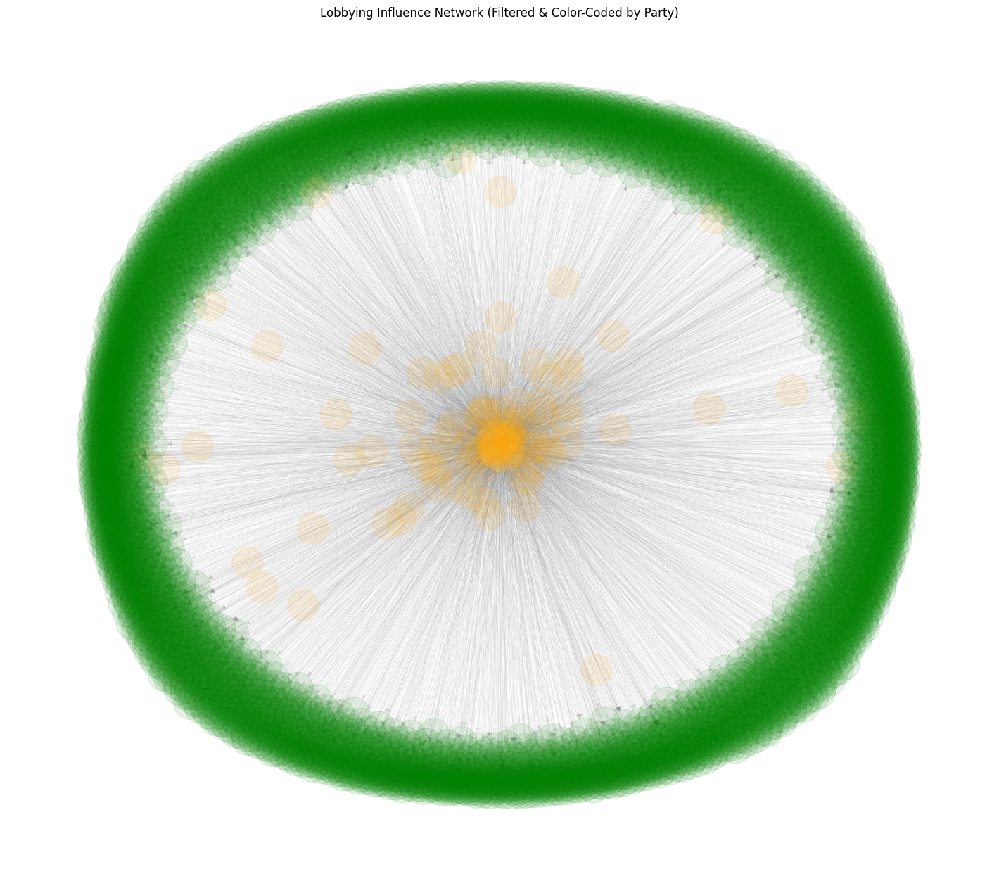

In [ ]:
# Reconstruct Graph G (Modify as needed)
G = nx.DiGraph()
for _, row in df_edges_final.iterrows():
    G.add_edge(row["UItorg"], row["B_ID"], weight=row["Amount"])
for _, row in df_bills_final.iterrows():
    G.add_edge(row["B_ID"], row["SponsorName"])

#  Reduce Edge Density (Keep Only Strongest Lobbying Connections)
threshold = df_edges_final["Amount"].quantile(0.97)  # Keep top 3% highest lobbying amounts
filtered_edges = df_edges_final[df_edges_final["Amount"] >= threshold]

# Filter for bills that were lobbied by at least 5 different lobbyists
bill_counts = df_edges_final["B_ID"].value_counts()
important_bills = bill_counts[bill_counts >= 5].index  # Keep only bills with 5+ lobbyists
filtered_edges = filtered_edges[filtered_edges["B_ID"].isin(important_bills)]

# Create a subgraph with only the strongest connections
strong_edges = [(row["UItorg"], row["B_ID"]) for _, row in filtered_edges.iterrows()]
subG = G.edge_subgraph(strong_edges).copy()

#  Community Detection - Identify Lobbying Clusters
communities = nx.community.louvain_communities(subG)  # Louvain method for clustering
community_map = {node: i for i, comm in enumerate(communities) for node in comm}

#  Compute Centrality and Adjust Node Sizes
degree_centrality = nx.degree_centrality(subG)
node_sizes = [1000 + 5000 * degree_centrality.get(node, 0) for node in subG.nodes()]

#  Assign Node Colors Based on Type & Party Affiliation
color_map = []
for node in subG:
    if node in df_bills_final["B_ID"].values:
        color_map.append("green")  # Bills
    elif node in df_edges_final["UItorg"].values:
        color_map.append("orange")  # Lobbyists
    elif node in df_bills_final["SponsorName"].values:
        # Check party affiliation and color accordingly
        party = df_bills_final[df_bills_final["SponsorName"] == node]["SponsorParty"].values[0]
        if party == "D":
            color_map.append("blue")  # Democrats
        elif party == "R":
            color_map.append("red")  # Republicans
        else:
            color_map.append("purple")  # Independents / Third Party
    else:
        color_map.append(f"C{community_map.get(node, 0)}")  # Color by community

#  Use Fruchterman-Reingold Layout for Better Separation
pos = nx.fruchterman_reingold_layout(subG, seed=42)

#  Plot the Improved Network Visualization
plt.figure(figsize=(14, 12))
nx.draw(subG, pos, with_labels=False, node_color=color_map, node_size=node_sizes, 
        edge_color="gray", width=0.3, alpha=0.1)  # Lighter, semi-transparent edges
plt.title("Lobbying Influence Network (Filtered & Color-Coded by Party)")
plt.show()

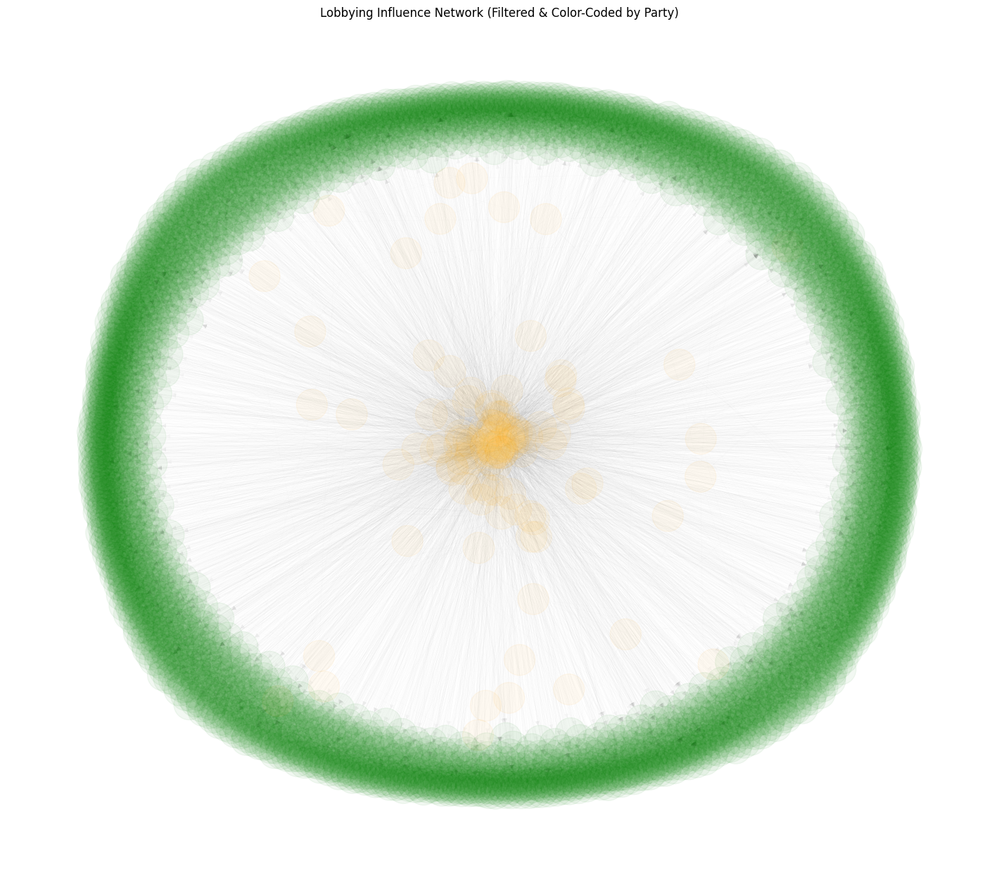

In [ ]:
#  Reconstruct Graph G
G = nx.DiGraph()
for _, row in df_edges_final.iterrows():
    G.add_edge(row["UItorg"], row["B_ID"], weight=row["Amount"])
for _, row in df_bills_final.iterrows():
    G.add_edge(row["B_ID"], row["SponsorName"])

#  Reduce Edge Density (Keep Only Strongest Lobbying Connections)
threshold = df_edges_final["Amount"].quantile(0.97)  # Keep top 3% highest lobbying amounts
filtered_edges = df_edges_final[df_edges_final["Amount"] >= threshold]

#  Filter for Only the Most Lobbied Bills (Reduce Green Overload)
bill_counts = df_edges_final["B_ID"].value_counts()
important_bills = bill_counts[bill_counts >= 10].index  # Keep only bills lobbied by at least 10 organizations
filtered_edges = filtered_edges[filtered_edges["B_ID"].isin(important_bills)]

#  Create a Subgraph with Only the Strongest Connections
strong_edges = [(row["UItorg"], row["B_ID"]) for _, row in filtered_edges.iterrows()]
subG = G.edge_subgraph(strong_edges).copy()

#  Community Detection - Identify Lobbying Clusters
communities = nx.community.louvain_communities(subG)  # Louvain method for clustering
community_map = {node: i for i, comm in enumerate(communities) for node in comm}

#  Compute Centrality and Adjust Node Sizes
node_sizes = [
    2000 if node in df_bills_final["SponsorName"].values else 1000 + 5000 * nx.degree_centrality(subG).get(node, 0)
    for node in subG.nodes()
]

#  Assign Node Colors Based on Type & Party Affiliation (Fixing the Lobbyist Color Issue)
color_map = []
for node in subG:
    if node in df_bills_final["B_ID"].values:
        color_map.append("green")  # Bills
    elif node in df_edges_final["UItorg"].values:
        color_map.append("orange")  # Lobbyists (Now differentiated from politicians)
    elif node in df_bills_final["SponsorName"].values:
        # Check party affiliation and color accordingly
        party = df_bills_final[df_bills_final["SponsorName"] == node]["SponsorParty"].values[0]
        if party == "D":
            color_map.append("blue")  # Democrats
        elif party == "R":
            color_map.append("red")  # Republicans
        else:
            color_map.append("purple")  # Independents / Third Party
    else:
        color_map.append(f"C{community_map.get(node, 0)}")  # Color by community

#  Use Fruchterman-Reingold Layout for Better Separation
pos = nx.fruchterman_reingold_layout(subG, seed=42)

#  Plot the Improved Network Visualization (More Transparent Edges & Thinner)
plt.figure(figsize=(14, 12))
nx.draw(subG, pos, with_labels=False, node_color=color_map, node_size=node_sizes, 
        edge_color="gray", width=0.2, alpha=0.05)  # More transparent & thinner edges
plt.title("Lobbying Influence Network (Filtered & Color-Coded by Party)")
plt.show()

/Users/christianhjorth/Library/Python/3.9/lib/python/site-packages/networkx/drawing/layout.py:724: RuntimeWarning:

divide by zero encountered in divide



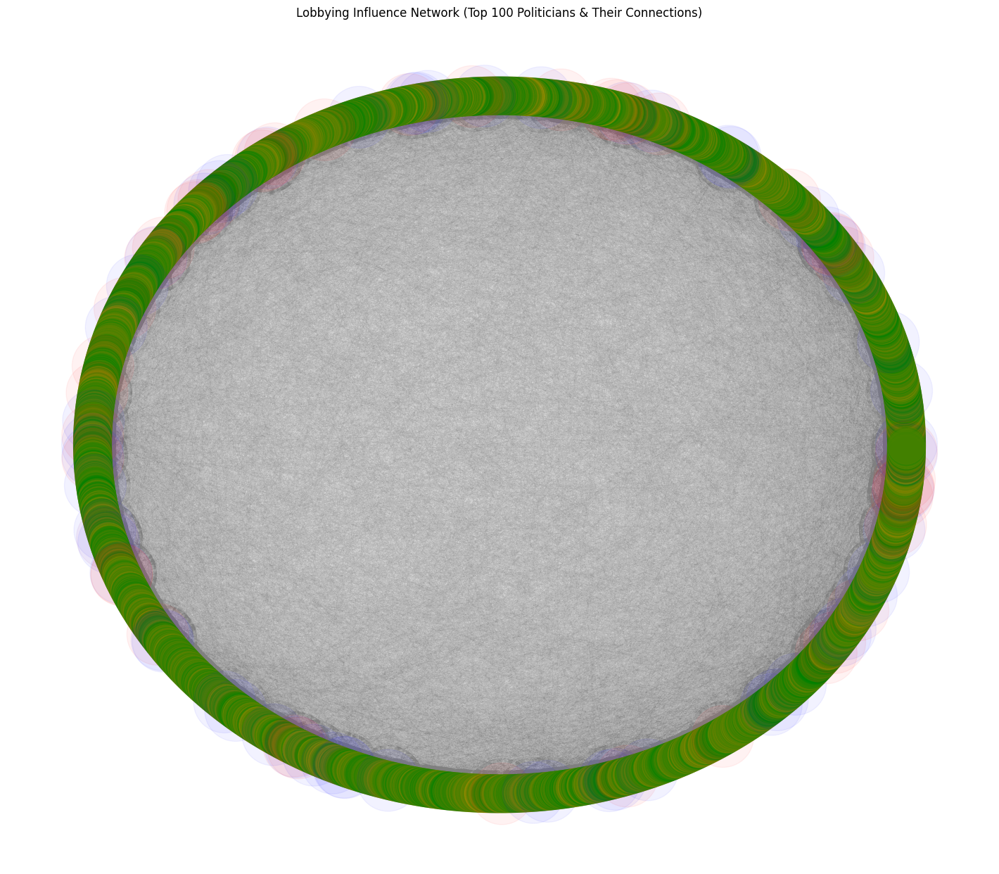

In [ ]:
#  Reconstruct Graph G
G = nx.DiGraph()
for _, row in df_edges_final.iterrows():
    G.add_edge(row["UItorg"], row["B_ID"], weight=row["Amount"])
for _, row in df_bills_final.iterrows():
    G.add_edge(row["B_ID"], row["SponsorName"])

#  Identify Top 100 Politicians by Number of Lobbying Connections
politician_counts = df_bills_final["SponsorName"].value_counts()
top_politicians = politician_counts.head(100).index.tolist()  # Get top 100 politicians

#  Filter Graph to Keep Only Top Politicians and Their Connections
top_politician_nodes = set(top_politicians)
connected_nodes = set()

# Find all lobbyists and bills connected to these politicians
for _, row in df_bills_final.iterrows():
    if row["SponsorName"] in top_politician_nodes:
        connected_nodes.add(row["B_ID"])  # Add bill
for _, row in df_edges_final.iterrows():
    if row["B_ID"] in connected_nodes:
        connected_nodes.add(row["UItorg"])  # Add lobbyist

# Combine politicians, bills, and lobbyists into one set
filtered_nodes = top_politician_nodes.union(connected_nodes)
subG = G.subgraph(filtered_nodes).copy()

#  Compute Centrality and Adjust Node Sizes
degree_centrality = nx.degree_centrality(subG)
node_sizes = [4000 if node in top_politician_nodes else 1500 for node in subG.nodes()]

#  Assign Node Colors Based on Type & Party Affiliation
color_map = []
for node in subG:
    if node in df_bills_final["B_ID"].values:
        color_map.append("green")  # Bills
    elif node in df_edges_final["UItorg"].values:
        color_map.append("orange")  # Lobbyists
    elif node in top_politician_nodes:
        # Check party affiliation and color accordingly
        party = df_bills_final[df_bills_final["SponsorName"] == node]["SponsorParty"].values[0]
        if party == "D":
            color_map.append("blue")  # Democrats
        elif party == "R":
            color_map.append("red")  # Republicans
        else:
            color_map.append("purple")  # Independents / Third Party
    else:
        color_map.append("gray")  # Other nodes

#  Use Kamada-Kawai Layout for Better Spacing
pos = nx.kamada_kawai_layout(subG)

#  Plot the Improved Network Visualization
plt.figure(figsize=(14, 12))
nx.draw(subG, pos, with_labels=False, node_color=color_map, node_size=node_sizes, 
        edge_color="gray", width=0.2, alpha=0.05)
plt.title("Lobbying Influence Network (Top 100 Politicians & Their Connections)")
plt.show()

/Users/christianhjorth/Library/Python/3.9/lib/python/site-packages/networkx/drawing/layout.py:724: RuntimeWarning:

divide by zero encountered in divide



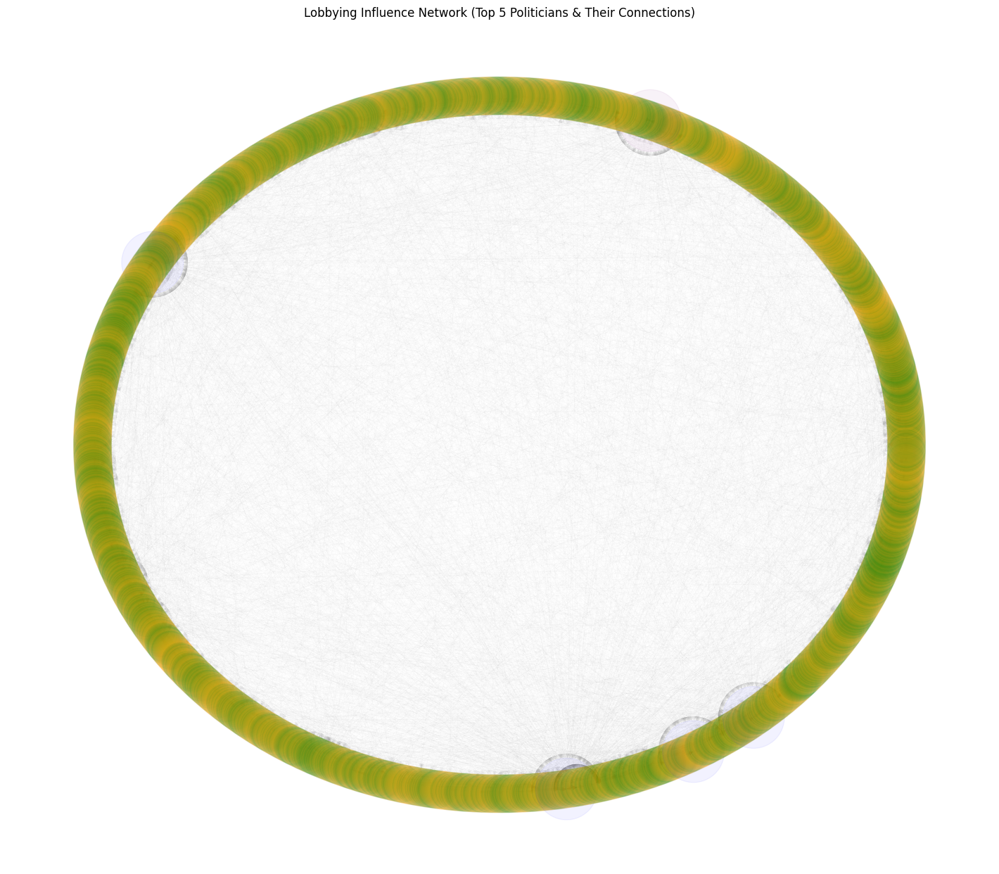

In [ ]:
#  Reconstruct Graph G
G = nx.DiGraph()
for _, row in df_edges_final.iterrows():
    G.add_edge(row["UItorg"], row["B_ID"], weight=row["Amount"])
for _, row in df_bills_final.iterrows():
    G.add_edge(row["B_ID"], row["SponsorName"])

#  Identify Top 100 Politicians by Number of Lobbying Connections
politician_counts = df_bills_final["SponsorName"].value_counts()
top_politicians = politician_counts.head(5).index.tolist()  # Get top 100 politicians

#  Filter Graph to Keep Only Top Politicians and Their Connections
top_politician_nodes = set(top_politicians)
connected_nodes = set()

# Find all lobbyists and bills connected to these politicians
for _, row in df_bills_final.iterrows():
    if row["SponsorName"] in top_politician_nodes:
        connected_nodes.add(row["B_ID"])  # Add bill
for _, row in df_edges_final.iterrows():
    if row["B_ID"] in connected_nodes:
        connected_nodes.add(row["UItorg"])  # Add lobbyist

# Combine politicians, bills, and lobbyists into one set
filtered_nodes = top_politician_nodes.union(connected_nodes)
subG = G.subgraph(filtered_nodes).copy()

#  Compute Centrality and Adjust Node Sizes
degree_centrality = nx.degree_centrality(subG)
node_sizes = [4000 if node in top_politician_nodes else 1500 for node in subG.nodes()]

#  Assign Node Colors Based on Type & Party Affiliation
color_map = []
for node in subG:
    if node in df_bills_final["B_ID"].values:
        color_map.append("green")  # Bills
    elif node in df_edges_final["UItorg"].values:
        color_map.append("orange")  # Lobbyists
    elif node in top_politician_nodes:
        # Check party affiliation and color accordingly
        party = df_bills_final[df_bills_final["SponsorName"] == node]["SponsorParty"].values[0]
        if party == "D":
            color_map.append("blue")  # Democrats
        elif party == "R":
            color_map.append("red")  # Republicans
        else:
            color_map.append("purple")  # Independents / Third Party
    else:
        color_map.append("gray")  # Other nodes

#  Use Kamada-Kawai Layout for Better Spacing
pos = nx.kamada_kawai_layout(subG)

#  Plot the Improved Network Visualization
plt.figure(figsize=(14, 12))
nx.draw(subG, pos, with_labels=False, node_color=color_map, node_size=node_sizes, 
        edge_color="gray", width=0.2, alpha=0.05)
plt.title("Lobbying Influence Network (Top 5 Politicians & Their Connections)")
plt.show()

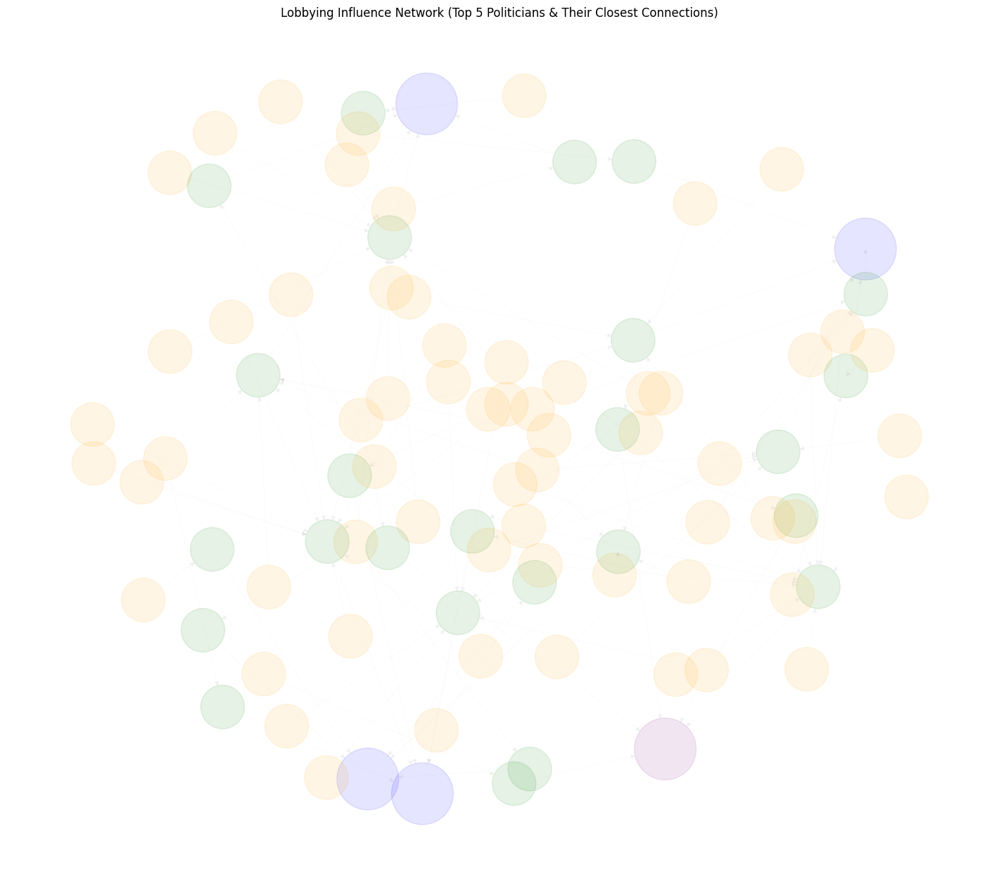

In [ ]:
#  Reconstruct Graph G
G = nx.DiGraph()
G.add_edges_from(zip(df_edges_final["UItorg"], df_edges_final["B_ID"]))  # Lobbyist → Bill
G.add_edges_from(zip(df_bills_final["B_ID"], df_bills_final["SponsorName"]))  # Bill → Politician

#  Identify Top 5 Politicians by Number of Connections
politician_counts = df_bills_final["SponsorName"].value_counts()
top_politicians = politician_counts.head(5).index.tolist()  # Get top 5 politicians

#  **Keep Only the Top 5 Most Lobbied Bills for Each Politician**
filtered_bills = set()
for politician in top_politicians:
    bills_linked = df_bills_final[df_bills_final["SponsorName"] == politician]["B_ID"]
    top_bills = bills_linked.value_counts().head(5).index  # Keep top 5 bills per politician
    filtered_bills.update(top_bills)

#  Keep Lobbyists Connected to These Selected Bills
lobbyists_connected = set(df_edges_final[df_edges_final["B_ID"].isin(filtered_bills)]["UItorg"])

#  Create a Subgraph with Only the Necessary Nodes
filtered_nodes = set(top_politicians).union(filtered_bills, lobbyists_connected)
subG = G.subgraph(filtered_nodes).copy()

#  Compute Centrality and Adjust Node Sizes
node_sizes = [4000 if node in top_politicians else 2000 for node in subG.nodes()]

#  Assign Node Colors Based on Type & Party
color_map = []
for node in subG:
    if node in filtered_bills:
        color_map.append("green")  # Bills
    elif node in lobbyists_connected:
        color_map.append("orange")  # Lobbyists
    elif node in top_politicians:
        # Check party affiliation and color accordingly
        party = df_bills_final[df_bills_final["SponsorName"] == node]["SponsorParty"].values[0]
        if party == "D":
            color_map.append("blue")  # Democrats
        elif party == "R":
            color_map.append("red")  # Republicans
        else:
            color_map.append("purple")  # Independents / Third Party
    else:
        color_map.append("gray")  # Other nodes

#  Use Spring Layout (Faster & More Readable)
pos = nx.spring_layout(subG, seed=42, k=0.5)  # Spread nodes apart

#  Plot the Improved Network Visualization
plt.figure(figsize=(14, 12))
nx.draw(subG, pos, with_labels=False, node_color=color_map, node_size=node_sizes, 
        edge_color="gray", width=0.2, alpha=0.1)
plt.title("Lobbying Influence Network (Top 5 Politicians & Their Closest Connections)")
plt.show()

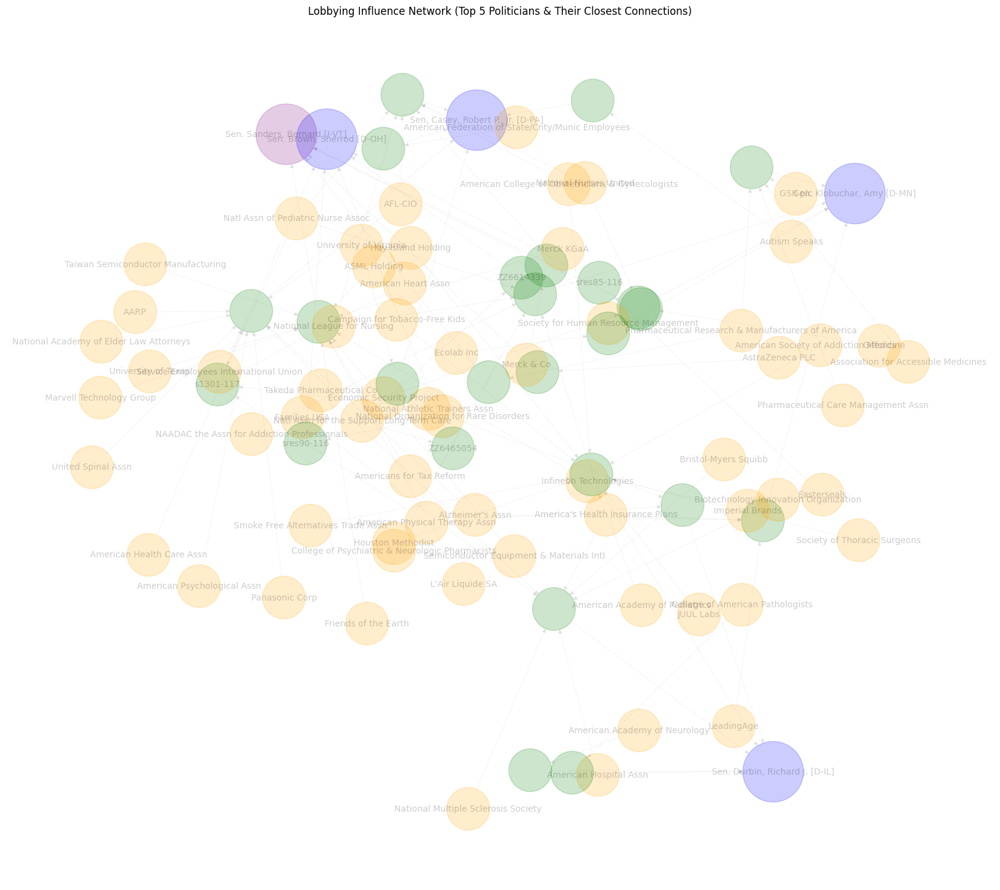

In [ ]:
#  Reconstruct Graph G
G = nx.DiGraph()
G.add_edges_from(zip(df_edges_final["UItorg"], df_edges_final["B_ID"]))  # Lobbyist → Bill
G.add_edges_from(zip(df_bills_final["B_ID"], df_bills_final["SponsorName"]))  # Bill → Politician

#  Identify Top 5 Politicians by Number of Connections
politician_counts = df_bills_final["SponsorName"].value_counts()
top_politicians = politician_counts.head(5).index.tolist()  # Get top 5 politicians

#  Keep Only the Top 5 Most Lobbied Bills for Each Politician
filtered_bills = set()
for politician in top_politicians:
    bills_linked = df_bills_final[df_bills_final["SponsorName"] == politician]["B_ID"]
    top_bills = bills_linked.value_counts().head(5).index  # Keep top 5 bills per politician
    filtered_bills.update(top_bills)

#  Keep Lobbyists Connected to These Selected Bills
lobbyists_connected = set(df_edges_final[df_edges_final["B_ID"].isin(filtered_bills)]["UItorg"])

#  Create a Subgraph with Only the Necessary Nodes
filtered_nodes = set(top_politicians).union(filtered_bills, lobbyists_connected)
subG = G.subgraph(filtered_nodes).copy()

#  Compute Centrality and Adjust Node Sizes
node_sizes = [5000 if node in top_politicians else 2500 for node in subG.nodes()]

#  Assign Node Colors Based on Type & Party
color_map = []
for node in subG:
    if node in filtered_bills:
        color_map.append("green")  # Bills
    elif node in lobbyists_connected:
        color_map.append("orange")  # Lobbyists
    elif node in top_politicians:
        # Check party affiliation and color accordingly
        party = df_bills_final[df_bills_final["SponsorName"] == node]["SponsorParty"].values[0]
        if party == "D":
            color_map.append("blue")  # Democrats
        elif party == "R":
            color_map.append("red")  # Republicans
        else:
            color_map.append("purple")  # Independents / Third Party
    else:
        color_map.append("gray")  # Other nodes

#  Use Spring Layout (Better Spacing)
pos = nx.spring_layout(subG, seed=42, k=0.5)  

#  Add Labels (Only for Politicians & Major Lobbyists)
labels = {node: node if node in top_politicians or node in lobbyists_connected or node in top_bills else "" for node in subG.nodes()}

#  Plot the Improved Network
plt.figure(figsize=(16, 14))
nx.draw(subG, pos, with_labels=True, labels=labels, node_color=color_map, node_size=node_sizes, 
        font_size=10, font_color="black", edge_color="gray", width=0.3, alpha=0.2)
plt.title("Lobbying Influence Network (Top 5 Politicians & Their Closest Connections)")
plt.show()

In [57]:
import plotly.graph_objects as go
import networkx as nx

# Use Kamada-Kawai layout instead of Spring to avoid divide-by-zero errors
pos = nx.kamada_kawai_layout(subG)

# Create Edge List for Visualization
edge_x = []
edge_y = []
for edge in subG.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

# Create Edge Trace (Gray Edges)
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color="gray"),
    hoverinfo="none",
    mode="lines"
)

# Create Node Traces with Color & Labels
node_x = []
node_y = []
node_color = []
node_size = []
node_text = []

for node in subG.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    
    # Assign Color Based on Type
    if node in filtered_bills:
        node_color.append("green")  # Bills
    elif node in lobbyists_connected:
        node_color.append("orange")  # Lobbyists
    elif node in top_politicians:
        party = df_bills_final[df_bills_final["SponsorName"] == node]["SponsorParty"].values[0]
        if party == "D":
            node_color.append("blue")  # Democrats
        elif party == "R":
            node_color.append("red")  # Republicans
        else:
            node_color.append("purple")  # Independents / Third Party
    else:
        node_color.append("gray")  # Other nodes

    # Assign Node Size (Larger for Politicians)
    node_size.append(20 if node in top_politicians else 10)

    # Set Hover Text (Labels for Politicians & Key Lobbyists)
    node_text.append(node if node in top_politicians or node in lobbyists_connected else "")

# Create Node Trace
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode="markers+text",
    text=node_text,
    textposition="top center",
    marker=dict(
        showscale=True,
        colorscale="Viridis",
        color=node_color,
        size=node_size,
        line=dict(width=2)
    ),
    hoverinfo="text"
)

# Create Figure Layout
fig = go.Figure(
    data=[edge_trace, node_trace],
    layout=go.Layout(
        title="Interactive Lobbying Influence Network (Top 5 Politicians & Their Closest Connections)",
        showlegend=False,
        hovermode="closest",
        margin=dict(b=20, l=5, r=5, t=40),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
    )
)

# Show Interactive Graph
fig.show()

In [54]:
# Get unique years
years = sorted(df_edges_final["Year"].unique())

# Create DataFrame to store results
network_metrics = pd.DataFrame(columns=[
    "Year", "Num_Nodes", "Num_Edges", "Avg_Degree_Centrality",
    "Top_Politician_Degree", "Top_Lobbyist_Degree",
    "Avg_Betweenness_Centrality", "Top_Politician_Betweenness", "Top_Lobbyist_Betweenness",
    "Avg_Clustering", "Largest_Connected_Component"
])

for year in years:
    print(f"Processing {year}...")
    
    # Filter edges by year
    yearly_edges = df_edges_final[df_edges_final["Year"] == year]

    # Create yearly subgraph
    G_year = nx.DiGraph()
    G_year.add_edges_from(zip(yearly_edges["UItorg"], yearly_edges["B_ID"]))  # Lobbyist → Bill
    G_year.add_edges_from(zip(df_bills_final["B_ID"], df_bills_final["SponsorName"]))  # Bill → Politician

    # Compute Metrics
    num_nodes = len(G_year.nodes)
    num_edges = len(G_year.edges)
    
    # Degree Centrality
    degree_centrality = nx.degree_centrality(G_year)
    avg_degree = sum(degree_centrality.values()) / len(degree_centrality) if degree_centrality else 0
    top_politician_degree = max((degree_centrality.get(p, 0) for p in df_bills_final["SponsorName"].unique()), default=0)
    top_lobbyist_degree = max((degree_centrality.get(l, 0) for l in df_edges_final["UItorg"].unique()), default=0)

    # Betweenness Centrality
    betweenness = nx.betweenness_centrality(G_year)
    avg_betweenness = sum(betweenness.values()) / len(betweenness) if betweenness else 0
    top_politician_betweenness = max((betweenness.get(p, 0) for p in df_bills_final["SponsorName"].unique()), default=0)
    top_lobbyist_betweenness = max((betweenness.get(l, 0) for l in df_edges_final["UItorg"].unique()), default=0)

    # Clustering Coefficient
    clustering_coeff = nx.average_clustering(G_year.to_undirected()) if num_nodes > 1 else 0

    # Largest Connected Component (LCC)
    largest_cc = max(nx.weakly_connected_components(G_year), key=len, default=[])
    largest_cc_size = len(largest_cc)

    # Store Results
    network_metrics.loc[len(network_metrics)] = [
        year, num_nodes, num_edges, avg_degree,
        top_politician_degree, top_lobbyist_degree,
        avg_betweenness, top_politician_betweenness, top_lobbyist_betweenness,
        clustering_coeff, largest_cc_size
    ]

print(network_metrics)  # Print preview to console
network_metrics.to_csv("network_metrics_preview.csv", index=False)  # Save to CSV for review

Processing 2011...
Processing 2012...
Processing 2013...
Processing 2014...
Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing 2023...
      Year  Num_Nodes  Num_Edges  Avg_Degree_Centrality  \
0   2011.0    28522.0    38242.0               0.000094   
1   2012.0    28403.0    39370.0               0.000098   
2   2013.0    28478.0    36095.0               0.000089   
3   2014.0    28519.0    39018.0               0.000096   
4   2015.0    28478.0    38344.0               0.000095   
5   2016.0    28455.0    38661.0               0.000095   
6   2017.0    29072.0    38888.0               0.000092   
7   2018.0    28790.0    39638.0               0.000096   
8   2019.0    28653.0    40905.0               0.000100   
9   2020.0    29191.0    45207.0               0.000106   
10  2021.0    29579.0    43005.0               0.000098   
11  2022.0    29509.0    44928.0             

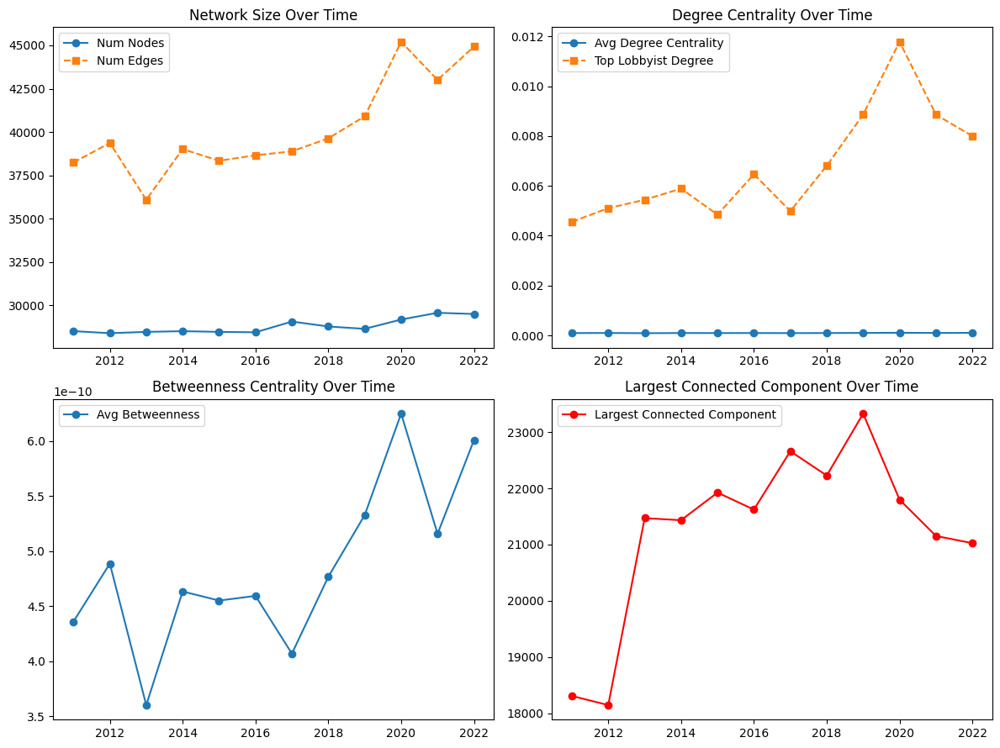

In [58]:
import matplotlib.pyplot as plt

network_metrics_filtered = network_metrics[network_metrics["Year"] <= 2022]

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 9))

# Number of Nodes & Edges
axes[0, 0].plot(network_metrics_filtered["Year"], network_metrics_filtered["Num_Nodes"], marker="o", label="Num Nodes")
axes[0, 0].plot(network_metrics_filtered["Year"], network_metrics_filtered["Num_Edges"], marker="s", linestyle="dashed", label="Num Edges")
axes[0, 0].set_title("Network Size Over Time")
axes[0, 0].legend()

# Degree Centrality
axes[0, 1].plot(network_metrics_filtered["Year"], network_metrics_filtered["Avg_Degree_Centrality"], marker="o", label="Avg Degree Centrality")
axes[0, 1].plot(network_metrics_filtered["Year"], network_metrics_filtered["Top_Lobbyist_Degree"], marker="s", linestyle="dashed", label="Top Lobbyist Degree")
axes[0, 1].set_title("Degree Centrality Over Time")
axes[0, 1].legend()

# Betweenness Centrality
axes[1, 0].plot(network_metrics_filtered["Year"], network_metrics_filtered["Avg_Betweenness_Centrality"], marker="o", label="Avg Betweenness")
axes[1, 0].set_title("Betweenness Centrality Over Time")
axes[1, 0].legend()

# Largest Connected Component
axes[1, 1].plot(network_metrics_filtered["Year"], network_metrics_filtered["Largest_Connected_Component"], marker="o", color="r", label="Largest Connected Component")
axes[1, 1].set_title("Largest Connected Component Over Time")
axes[1, 1].legend()

# # Clustering Coefficient
# axes[2, 0].plot(network_metrics["Year"], network_metrics["Avg_Clustering"], marker="o", color="g", label="Avg Clustering")
# axes[2, 0].set_title("Clustering Coefficient Over Time")
# axes[2, 0].legend()

# Adjust layout
plt.tight_layout()
plt.show()

In [53]:
import networkx as nx
import pandas as pd
import time

# Get the first two years only
years = sorted(df_edges_final["Year"].unique())[:2]

# Create DataFrame to store results
network_metrics = pd.DataFrame(columns=[
    "Year", "Num_Nodes", "Num_Edges", "Avg_Degree_Centrality",
    "Top_Politician_Degree", "Top_Lobbyist_Degree",
    "Avg_Betweenness_Centrality", "Top_Politician_Betweenness", "Top_Lobbyist_Betweenness",
    "Avg_Clustering", "Largest_Connected_Component"
])

for year in years:
    start_time = time.time()
    print(f"Processing {year}...")

    # Filter edges by year
    yearly_edges = df_edges_final[df_edges_final["Year"] == year]

    # Create yearly subgraph
    G_year = nx.DiGraph()
    G_year.add_edges_from(zip(yearly_edges["UItorg"], yearly_edges["B_ID"]))  # Lobbyist → Bill
    G_year.add_edges_from(zip(df_bills_final["B_ID"], df_bills_final["SponsorName"]))  # Bill → Politician

    # Compute Metrics
    num_nodes = len(G_year.nodes)
    num_edges = len(G_year.edges)

    # Degree Centrality
    degree_centrality = nx.degree_centrality(G_year)
    avg_degree = sum(degree_centrality.values()) / len(degree_centrality) if degree_centrality else 0
    top_politician_degree = max((degree_centrality.get(p, 0) for p in df_bills_final["SponsorName"].unique()), default=0)
    top_lobbyist_degree = max((degree_centrality.get(l, 0) for l in df_edges_final["UItorg"].unique()), default=0)

    # Betweenness Centrality (LIMIT TO TOP 500 NODES FOR SPEED)
    top_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:500]
    betweenness = nx.betweenness_centrality(G_year, k=500)  # Approximate for speed
    avg_betweenness = sum(betweenness.values()) / len(betweenness) if betweenness else 0
    top_politician_betweenness = max((betweenness.get(p, 0) for p in df_bills_final["SponsorName"].unique()), default=0)
    top_lobbyist_betweenness = max((betweenness.get(l, 0) for l in df_edges_final["UItorg"].unique()), default=0)

    # Clustering Coefficient
    clustering_coeff = nx.average_clustering(G_year.to_undirected()) if num_nodes > 1 else 0

    # Largest Connected Component (LCC)
    largest_cc = max(nx.weakly_connected_components(G_year), key=len, default=[])
    largest_cc_size = len(largest_cc)

    # Store Results
    network_metrics.loc[len(network_metrics)] = [
        year, num_nodes, num_edges, avg_degree,
        top_politician_degree, top_lobbyist_degree,
        avg_betweenness, top_politician_betweenness, top_lobbyist_betweenness,
        clustering_coeff, largest_cc_size
    ]

    print(f"Completed {year} in {time.time() - start_time:.2f} seconds.")

# Display Results
print(network_metrics)  # Print preview to console


Processing 2011...
Completed 2011 in 11.00 seconds.
Processing 2012...
Completed 2012 in 11.05 seconds.
     Year  Num_Nodes  Num_Edges  Avg_Degree_Centrality  Top_Politician_Degree  \
0  2011.0    28522.0    38242.0               0.000094               0.008134   
1  2012.0    28403.0    39370.0               0.000098               0.008168   

   Top_Lobbyist_Degree  Avg_Betweenness_Centrality  \
0             0.004558                5.065041e-10   
1             0.005105                6.049748e-10   

   Top_Politician_Betweenness  Top_Lobbyist_Betweenness  Avg_Clustering  \
0                         0.0                       0.0             0.0   
1                         0.0                       0.0             0.0   

   Largest_Connected_Component  
0                      18310.0  
1                      18147.0  
